<a href="https://colab.research.google.com/github/abhinavdayal/DepthMask/blob/master/S15Assignment_4_MSSSIM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Libraries

In [0]:
import os
from getpass import getpass
password = getpass('abhinavdayal')
os.environ['GITHUB_AUTH'] = 'abhinavdayal:'+password

!git clone https://$GITHUB_AUTH@github.com/abhinavdayal/EVA4_LIBRARY.git

In [0]:
import os

In [0]:
import sys

In [0]:
sys.path.append("/content/EVA4_LIBRARY/EVA4")

In [6]:
from google.colab import drive
drive.mount('drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at drive


# Dataset and Creating Train/Test Split

Get the imagenet dataset

In [24]:
import time
start=time.time()
from zipfile import ZipFile
# Create a ZipFile Object and load sample.zip in it
with ZipFile('/content/drive/My Drive/S15A/out2.zip', 'r') as zipObj:
# Extract all the contents of zip file in current directory
  zipObj.extractall()
print(time.time()-start)

249.19343423843384


In [3]:
!nvidia-smi

Mon May 25 15:19:08 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.82       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P0    28W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

## Data collection and Prep

Get the Albumentations library

In [10]:
!pip install -U git+https://github.com/albu/albumentations > /dev/null && echo "All libraries are successfully installed!"

  Running command git clone -q https://github.com/albu/albumentations /tmp/pip-req-build-_998pre7
All libraries are successfully installed!


## Data Transformations




In [0]:
import cv2
import numpy as np
import albumentations as A
from torchvision import transforms
import albumentations.pytorch as AP

# The values here are elsewhere calculated
channel_means = ( 0.50610699, 0.5250236, 0.51219183 )
channel_stdevs = ( 0.28525343, 0.24801724, 0.24747186 )

# Train Phase transformations

transforms = [
                 A.Rotate(limit=10),
                 A.HorizontalFlip(),
                 #A.GridDistortion(),
                 #A.Resize(80, 80),
             ]

image_transforms = [
                      A.RandomBrightnessContrast(),
                      A.GaussianBlur(),
                      A.ToGray(),
                   ]

fillmeans = (np.array(channel_means)).astype(np.uint8)

test_transforms = None #[A.Resize(80, 80)]



## Get Dataset
Create 70/30 split after combining train/test
We have separately calculated the mean/std or we can use 0.5s

In [0]:
from eva4datasets import fgbgdata

train_data, test_data = fgbgdata.fgbg_test_train('out2', 0.7, 1)
#train = fgbgdata.FGBGDataset(train_data, transforms, channel_means, channel_stdevs, image_transforms)
#test = fgbgdata.FGBGDataset(test_data, test_transforms, channel_means, channel_stdevs)
train = fgbgdata.FGBGDataset(train_data, None, channel_means, channel_stdevs, None)
test = fgbgdata.FGBGDataset(test_data, None, channel_means, channel_stdevs)

# Dataloader Arguments & Test/Train Dataloaders


In [0]:
import eva4dataloaders
batch_size = 32

dataloader = eva4dataloaders.DataLoader(batch_size=batch_size, shuffle=True)

# train dataloader
train_loader = dataloader.load(train)

# test dataloader
test_loader = dataloader.load(test)

# Data Statistics

It is important to know your data very well. Let's check some of the statistics around our data and how it actually looks like

In [0]:
%load_ext tensorboard

In [34]:
#%tensorboard --logdir '/content/drive/My Drive/S15F/runs'
%tensorboard --logdir 'runs'

Reusing TensorBoard on port 6007 (pid 7525), started 0:46:04 ago. (Use '!kill 7525' to kill it.)

<IPython.core.display.Javascript object>

# Model Creation


In [10]:
from eva4models.s15netED import S15NetED
import torch

def init_weights(m):
    if str(type(m)).startswith('torch.nn.modules.conv') :
      torch.nn.init.kaiming_normal_(m.weight, a=0, mode='fan_in', nonlinearity='leaky_relu')

model = S15NetED(name="S15Neted2")
model.apply(init_weights)

use_cuda = torch.cuda.is_available()
model.device = torch.device("cuda" if use_cuda else "cpu")
model.to(model.device)
model.summary((3,160, 160))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 160, 160]             432
       BatchNorm2d-2         [-1, 16, 160, 160]              32
            Conv2d-3         [-1, 32, 160, 160]           4,608
       BatchNorm2d-4         [-1, 32, 160, 160]              64
            Conv2d-5         [-1, 64, 160, 160]          18,432
       BatchNorm2d-6         [-1, 64, 160, 160]             128
      InitialBlock-7         [-1, 64, 160, 160]               0
            Conv2d-8           [-1, 32, 80, 80]          18,432
       BatchNorm2d-9           [-1, 32, 80, 80]              64
           Conv2d-10           [-1, 32, 80, 80]           9,216
      BatchNorm2d-11           [-1, 32, 80, 80]              64
      EncoderPath-12           [-1, 32, 80, 80]               0
           Conv2d-13           [-1, 32, 80, 80]          18,432
      BatchNorm2d-14           [-1, 32,

In [0]:
model

S15NetED(
  (prepLayer): InitialBlock(
    (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (encoder): Encoder(
    (encoder1): EncoderBlock(
      (direct): Conv2d(64, 32, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (directbn): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (path1): EncoderPath(
        (conv1): Conv2d(64, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affin

In [27]:
import os
model.load_state_dict(torch.load(os.path.join('/content/drive/My Drive/S15F', model.name+'.pt')))

<All keys matched successfully>

In [0]:
import runbuilder
m = runbuilder.RunManager('/content/drive/My Drive/S15F', channel_means, channel_stdevs, classification=False, visdecoder={'mask':1, 'depth':2})

## LR Finder

In [0]:
import torch.nn.functional as F
from eva4LRFinder2 import LRRangeFinder
import torch.optim as optim
from eva4losses import CustomLoss, MixedLoss, MSSSIM
#from eva4losses.diceloss import DiceLoss
L1lambda = 0
L2lambda = 1e-4
depthloss = MixedLoss(nn.L1Loss(), MSSSIM(21), 0.16)
maskloss = MixedLoss(nn.L1Loss(), MSSSIM(21), 0.16)
criterion = CustomLoss(maskloss, depthloss, 4)


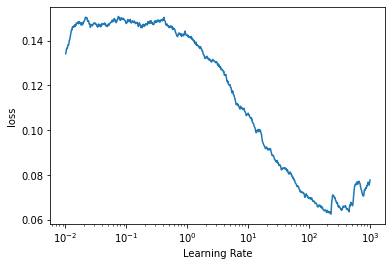

229.08676527677713

In [0]:
optimizer = optim.SGD(model.parameters(), lr=1e-2) #optim.Adam(model.parameters(), lr=1e-5, weight_decay=L2lambda) # 
lr_finder = LRRangeFinder(model, optimizer, criterion, 1, 1e-2, 1000, train_loader)
lr_finder.range_test()

# Training and Testing


In [0]:
import torch.optim as optim
import torch.nn as nn
import torch
#https://research.nvidia.com/sites/default/files/pubs/2017-03_Loss-Functions-for/NN_ImgProc.pdf
L1lambda = 0
L2lambda = 0
EPOCHS = 10

max_lr = 500
optimizer = optim.SGD(model.parameters(), lr=max_lr/100, momentum=0.9, nesterov=True, weight_decay=L2lambda)
# scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=max_lr, steps_per_epoch=len(train_loader), div_factor=5, pct_start=0.2, epochs=EPOCHS)
# scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=max_lr, steps_per_epoch=int(len(train)/batch_size)+1, epochs=EPOCHS,  pct_start=5/24, div_factor=600, final_div_factor=1 )
#scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=max_lr, steps_per_epoch=int(len(train_loader))+1, epochs=EPOCHS,  pct_start=0.2, div_factor=10, final_div_factor=10 )
scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer, base_lr = 0.003, max_lr=max_lr, mode='triangular2')

model.trainTensorboard(optimizer, train_loader, test_loader, EPOCHS, m, {'lr':'cyclic', 'loss':'MSSSIM+L1'}, criterion, scheduler, True, L1lambda)


cuda
initialized trainer with  cuda
initialized tester with  cuda



OrderedDict([('run', 1), ('epoch', 1), ('train loss', 0.05455975687674114), ('test loss', 0.031239674959580105), ('epoch duration', 1810.610496520996), ('run duration', 1822.5000178813934), ('lr', 'cyclic'), ('loss', 'MSSSIM+L1')])
Learning Rate = 453.000282



OrderedDict([('run', 1), ('epoch', 2), ('train loss', 0.027720344768251692), ('test loss', 0.022034362781047822), ('epoch duration', 1778.0810859203339), ('run duration', 3601.1791667938232), ('lr', 'cyclic'), ('loss', 'MSSSIM+L1')])
Learning Rate = 47.002718



OrderedDict([('run', 1), ('epoch', 3), ('train loss', 0.025090361023800713), ('test loss', 0.02190274982849757), ('epoch duration', 1790.0749440193176), ('run duration', 5391.671892642975), ('lr', 'cyclic'), ('loss', 'MSSSIM+L1')])
Learning Rate = 179.501923



OrderedDict([('run', 1), ('epoch', 4), ('train loss', 0.022699459762232643), ('test loss', 0.019970112256209056), ('epoch duration', 1776.0782086849213), ('run duration', 7168.195229291916), ('lr', 'cyclic'), ('loss', 'MSSSIM+L1')])
Learning Rate = 47.002718



OrderedDict([('run', 1), ('epoch', 5), ('train loss', 0.022106218583243235), ('test loss', 0.019418001594146094), ('epoch duration', 1767.43652677536), ('run duration', 8936.065888881683), ('lr', 'cyclic'), ('loss', 'MSSSIM+L1')])
Learning Rate = 66.252603



OrderedDict([('run', 1), ('epoch', 6), ('train loss', 0.020850031024217605), ('test loss', 0.018917938536405565), ('epoch duration', 1769.9883573055267), ('run duration', 10706.495237112045), ('lr', 'cyclic'), ('loss', 'MSSSIM+L1')])
Learning Rate = 35.252789



OrderedDict([('run', 1), ('epoch', 7), ('train loss', 0.020803774543319428), ('test loss', 0.01856564057270686), ('epoch duration', 1778.6956193447113), ('run duration', 12485.628858327866), ('lr', 'cyclic'), ('loss', 'MSSSIM+L1')])
Learning Rate = 21.377872



OrderedDict([('run', 1), ('epoch', 8), ('train loss', 0.02000777949179922), ('test loss', 0.018361366146802904), ('epoch duration', 1779.5404753684998), ('run duration', 14265.590973854065), ('lr', 'cyclic'), ('loss', 'MSSSIM+L1')])
Learning Rate = 23.502859



OrderedDict([('run', 1), ('epoch', 9), ('train loss', 0.019939309678758895), ('test loss', 0.018018476857741675), ('epoch duration', 1781.0071971416473), ('run duration', 16047.00755906105), ('lr', 'cyclic'), ('loss', 'MSSSIM+L1')])
Learning Rate = 4.815471



OrderedDict([('run', 1), ('epoch', 10), ('train loss', 0.019619432886157716), ('test loss', 0.018045202326774597), ('epoch duration', 1757.1290428638458), ('run duration', 17804.568453788757), ('lr', 'cyclic'), ('loss', 'MSSSIM+L1')])
Learning Rate = 14.690412



In [17]:
EPOCHS = 1
max_lr = 200
optimizer = optim.SGD(model.parameters(), lr=max_lr/100, momentum=0.9, nesterov=True, weight_decay=L2lambda)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=max_lr, steps_per_epoch=int(len(train_loader))+1, epochs=EPOCHS,  pct_start=0.2, div_factor=10, final_div_factor=10 )
model.trainTensorboard(optimizer, train_loader, test_loader, EPOCHS, m, {'lr':'160+cyclic', 'loss':'MSSSIM+L1'}, criterion, scheduler, True, L1lambda)

cuda
initialized trainer with  cuda
initialized tester with  cuda



OrderedDict([('run', 1), ('epoch', 1), ('train loss', 0.08325678558711495), ('test loss', 0.06721759030073882), ('epoch duration', 11928.405941724777), ('run duration', 11936.150328874588), ('lr', '160+cyclic'), ('loss', 'MSSSIM+L1')])
Learning Rate = 2.000000



In [34]:
import torch.optim as optim
import torch.nn as nn
import torch
EPOCHS = 4
max_lr = 100
optimizer = optim.SGD(model.parameters(), lr=max_lr/100, momentum=0.9, nesterov=True, weight_decay=L2lambda)
scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer, base_lr = 0.003, max_lr=max_lr, mode='triangular2', step_size_up = 1500, step_size_down=2000)
model.trainTensorboard(optimizer, train_loader, test_loader, EPOCHS, m, {'lr':'160+cyclic', 'loss':'adaptive MSSSIM+L1'}, criterion, scheduler, True, L1lambda)

cuda
initialized trainer with  cuda
initialized tester with  cuda



OrderedDict([('run', 1), ('epoch', 1), ('train loss', 0.048709943938468184), ('test loss', 0.04655013868709405), ('epoch duration', 6880.234774827957), ('run duration', 6884.847589969635), ('lr', '160+cyclic'), ('loss', 'adaptive MSSSIM+L1')])
Learning Rate = 0.003000



OrderedDict([('run', 1), ('epoch', 2), ('train loss', 0.046147701483752045), ('test loss', 0.045504256978631016), ('epoch duration', 6874.474990367889), ('run duration', 13760.465213775635), ('lr', '160+cyclic'), ('loss', 'adaptive MSSSIM+L1')])
Learning Rate = 0.003000


KeyboardInterrupt: ignored